In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from mpl_toolkits.mplot3d import Axes3D

import time
import folium
from folium import plugins

In [57]:
apData = pd.read_csv('./Data/yelpData0-4927.csv')
apData = apData.dropna()

In [58]:
apData

,Date,Adress,Size,Rooms,Broker,Rent,Price,NearbyPOIs,Latitude,Longitude
0,20210611.0,Fatburs Brunnsgata 30,92.0,4.0,Fastighetsbyrån Stockholm - Södermalm,4393.0,7500000.0,1100.0,59.313881,18.067017
1,20210610.0,Skebokvarnsvägen 366,92.5,4.0,Fastighetsbyrån Farsta/ Högdalen/ Skogås,5953.0,3950000.0,21.0,59.261980,18.040237
2,20210610.0,Nimrodsgatan 23,91.0,4.0,Alicia Edelman Fastighetsmäkleri,4195.0,10025000.0,127.0,59.354856,18.098602
3,20210610.0,Sockerbruksgränd 18,95.0,4.0,Notar,4127.0,8375000.0,326.0,59.309325,18.048477
4,20210610.0,Beckomberga Ängsväg 22,91.0,4.0,Svenska Mäklarhuset Bromma,4730.0,5000000.0,20.0,59.356955,17.899475
...,...,...,...,...,...,...,...,...,...,...
4922,20130215.0,Båtholmsbacken 6,100.0,4.0,Mäklarringen Hägersten/Skärholmen/Älvsjö,4361.0,1760000.0,5.0,59.273208,17.882996
4923,2013027.0,Petrejusvägen 18,99.0,4.0,Fastighetsbyrån Enskede,5338.0,2925000.0,308.0,59.297758,18.095856
4924,20130129.0,Svärdlångsvägen 27,99.5,4.0,Notar,5963.0,3400000.0,195.0,59.300563,18.035431
4925,20130126.0,Stapelgatan 5,99.5,4.0,Fastighetsbyrån Stockholm - Hammarby Sjöstad,5020.0,5550000.0,157.0,59.308975,18.104095


In [59]:
apData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4927 entries, 0 to 4926
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        4927 non-null   float64
 1   Adress      4927 non-null   object 
 2   Size        4927 non-null   float64
 3   Rooms       4927 non-null   float64
 4   Broker      4927 non-null   object 
 5   Rent        4927 non-null   float64
 6   Price       4927 non-null   float64
 7   NearbyPOIs  4927 non-null   float64
 8   Latitude    4927 non-null   float64
 9   Longitude   4927 non-null   float64
dtypes: float64(8), object(2)
memory usage: 423.4+ KB


In [60]:
apData.head(5)

,Date,Adress,Size,Rooms,Broker,Rent,Price,NearbyPOIs,Latitude,Longitude
0,20210611.0,Fatburs Brunnsgata 30,92.0,4.0,Fastighetsbyrån Stockholm - Södermalm,4393.0,7500000.0,1100.0,59.313881,18.067017
1,20210610.0,Skebokvarnsvägen 366,92.5,4.0,Fastighetsbyrån Farsta/ Högdalen/ Skogås,5953.0,3950000.0,21.0,59.261980,18.040237
2,20210610.0,Nimrodsgatan 23,91.0,4.0,Alicia Edelman Fastighetsmäkleri,4195.0,10025000.0,127.0,59.354856,18.098602
3,20210610.0,Sockerbruksgränd 18,95.0,4.0,Notar,4127.0,8375000.0,326.0,59.309325,18.048477
4,20210610.0,Beckomberga Ängsväg 22,91.0,4.0,Svenska Mäklarhuset Bromma,4730.0,5000000.0,20.0,59.356955,17.899475


In [61]:
apData.isnull().values.any()

False

In [62]:
apData.describe()

,Date,Size,Rooms,Rent,Price,NearbyPOIs,Latitude,Longitude
count,4.927000e+03,4927.000000,4927.000000,4927.000000,4.927000e+03,4927.000000,4927.000000,4927.000000
mean,1.513738e+07,94.900812,3.938908,4910.071240,5.566116e+06,268.228131,59.320270,18.017481
std,8.130769e+06,2.970222,0.239523,906.277208,2.262914e+06,366.882211,0.037704,0.069319
min,2.013027e+06,90.000000,3.000000,653.000000,1.150000e+06,4.000000,59.232487,17.803345
25%,2.020119e+06,92.500000,4.000000,4374.000000,3.750000e+06,30.000000,59.292148,17.967453
50%,2.016063e+07,95.000000,4.000000,4988.000000,5.392000e+06,100.000000,59.314932,18.030624
75%,2.019033e+07,97.000000,4.000000,5470.000000,7.100000e+06,384.000000,59.344354,18.073883
max,2.021061e+07,100.000000,4.000000,7966.000000,1.460000e+07,1900.000000,59.500491,18.291550


<AxesSubplot:xlabel='Price'>

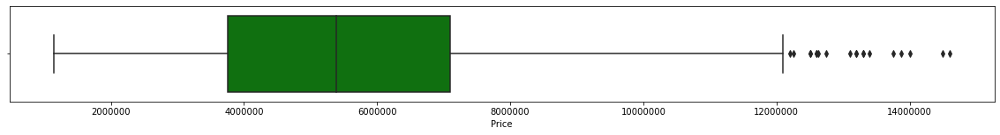

In [63]:
plt.figure(figsize=(20,2))
plt.ticklabel_format(style='plain')
sns.boxplot(x=apData['Price'], color="green")

<AxesSubplot:xlabel='NearbyPOIs'>

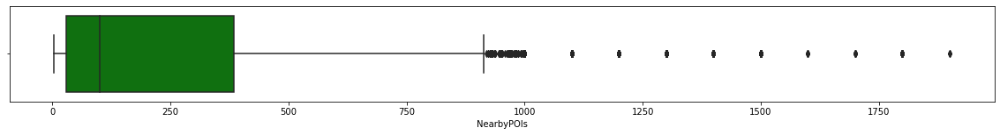

In [64]:
plt.figure(figsize=(20,2))
plt.ticklabel_format(style='plain')
sns.boxplot(x=apData['NearbyPOIs'], color="green")

<AxesSubplot:xlabel='Size'>

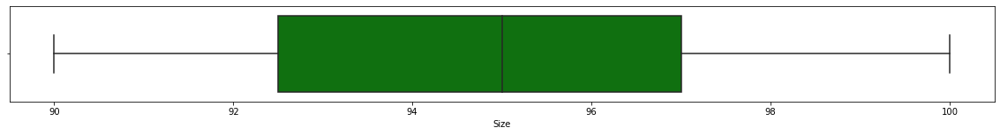

In [65]:
plt.figure(figsize=(20,2))
plt.ticklabel_format(style='plain')
sns.boxplot(x=apData['Size'], color="green")

In [66]:
tolerance= 0.8
minNum = 0
column = 'Price'

#Remove Outliers above the 3rd Quantile
quant = apData[column].quantile(tolerance)
print(quant)
apData = apData[apData[column] < quant]
apData = apData[apData[column] > minNum]

7500000.0


In [67]:
print(apData.shape)

(3913, 10)


<AxesSubplot:xlabel='Price'>

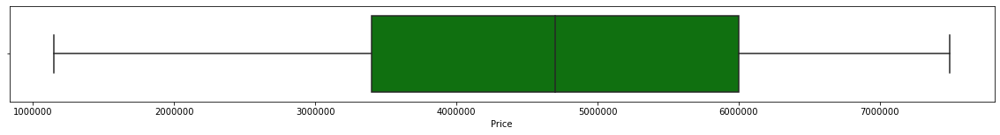

In [68]:
plt.figure(figsize=(20,2))
plt.ticklabel_format(style='plain')
sns.boxplot(x=apData['Price'], color="green")

In [69]:
#Save File to get final data to work with in Model
apData.to_csv('./Data/yelpDataGather.csv', index=False)

In [70]:
apData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3913 entries, 1 to 4926
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        3913 non-null   float64
 1   Adress      3913 non-null   object 
 2   Size        3913 non-null   float64
 3   Rooms       3913 non-null   float64
 4   Broker      3913 non-null   object 
 5   Rent        3913 non-null   float64
 6   Price       3913 non-null   float64
 7   NearbyPOIs  3913 non-null   float64
 8   Latitude    3913 non-null   float64
 9   Longitude   3913 non-null   float64
dtypes: float64(8), object(2)
memory usage: 336.3+ KB


In [71]:
apData = pd.read_csv('./Data/yelpDataGather.csv')

In [73]:
#Add two new columns for additional features in ML
#add PricePerKVM and PricePerRoom
fromRow = 0
toRow = 3913

apData['PricePerKvm'] = 0.0
apData['PricePerRoom'] = 0.0

for i in range(fromRow, toRow):
        #df.to_csv(name, index=False)

    apData.at[i, 'PricePerKvm'] = round(apData.at[i, 'Price'] / apData.at[i, 'Size'], 0)
    apData.at[i, 'PricePerRoom'] = round(apData.at[i, 'Price'] / apData.at[i, 'Rooms'], 0)

apData['PricePerKvm'] = apData['PricePerKvm'].astype('float')
apData['PricePerRoom'] = apData['PricePerRoom'].astype('float')

In [75]:
apData.head(5)

,Date,Adress,Size,Rooms,Broker,Rent,Price,NearbyPOIs,Latitude,Longitude,PricePerKvm,PricePerRoom
0,20210610.0,Skebokvarnsvägen 366,92.5,4.0,Fastighetsbyrån Farsta/ Högdalen/ Skogås,5953.0,3950000.0,21.0,59.261980,18.040237,42703.0,987500.0
1,20210610.0,Beckomberga Ängsväg 22,91.0,4.0,Svenska Mäklarhuset Bromma,4730.0,5000000.0,20.0,59.356955,17.899475,54945.0,1250000.0
2,2021069.0,Brf Grindavik - Kista Gårdsväg,91.1,4.0,Våningen & Villan Stockholm,4803.0,3995000.0,82.0,59.407398,17.943506,43853.0,998750.0
3,2021069.0,Arbetargatan 23A,92.0,3.0,HusmanHagberg Kungsholmen,4338.0,6650000.0,468.0,59.334550,18.027191,72283.0,2216667.0
4,2021069.0,Kista Alléväg 9,91.1,4.0,Våningen & Villan Stockholm,4803.0,3995000.0,81.0,59.407664,17.944107,43853.0,998750.0


In [76]:
#Save File to get final data to work with in Model
apData.to_csv('./Data/yelpDataGather.csv', index=False)

In [77]:
# Initializing the map to see coordinates gathered and if data is good or not
m = folium.Map([59.3508, 18.0973], zoom_start=11)

In [80]:
# mark each station as a point
for index, row in apData.iterrows():
    folium.CircleMarker([row['Latitude'], row['Longitude']],
                        radius=15,
                        popup=row['PricePerKvm'],
                        fill_color="#3db7e4", # divvy color
                       ).add_to(m)
m

In [81]:
#Some Location is not within Stockholm, but outside. We need to clean that up.

In [82]:
rowCount = len(apData.index)
# Only show rows close to Stockholms coordinates. Yelp might have returned a completely different location
adData = apData.loc[apData['Longitude'] > 17.6]
apData = apData.loc[apData['Longitude'] < 18.3]
apData = apData.loc[apData['Latitude'] < 59.45]
apData = apData.loc[apData['Latitude'] > 59.2]

print("removeWrongCoordinates removed",
        rowCount - len(apData.index), "rows from apData")

removeWrongCoordinates removed 1 rows from apData


In [83]:
#One Entry removed from DataFrame based on filtering abvove. 

In [84]:
#Save File to get final data to work with in Model
apData.to_csv('./Data/ScrappedDataClean.csv', index=False)